Setting the Environment -->

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import charset_normalizer
from ydata_profiling import ProfileReport
%matplotlib inline

In [3]:
with open("zomato.csv",'rb') as rawdata:
    result= charset_normalizer.detect(rawdata.read(10000))
print(result)

{'encoding': 'iso8859_10', 'language': 'English', 'confidence': 0.9956}


* The above code output signifies the encoding of the csv file of the zomato dataset.
* NOTE:- iso8859_10 can also be represented as latin-1.

Adding the required datasets -->

In [4]:
zomato_df= pd.read_csv("zomato.csv",encoding="latin-1") # 'iso8859_10' can also be used intead of latin-1 !!
zomato_df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [5]:
country_df= pd.read_excel("Country-Code.xlsx")
country_df.nunique()

Country Code    15
Country         15
dtype: int64

In [6]:
a= np.sort(zomato_df['Country Code'].unique())
b= np.sort(country_df['Country Code'].unique())
(a==b).sum()    # Must be 15 [No. of unique values of each] if all values match with each other.

15

NOTE:- 
1. Country Code is the Foreign Key for Zomato.csv table and Primary Key for Country-Code.xlsx table.
2. Both Datasets have same number of unique values for Country code !!
3. The relationship between zomato_df table and country_df table is many to one !!

As both have some relationship between them ,
merging the two datasets into a single one -->

In [7]:
df= zomato_df.merge(country_df,on='Country Code')
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines


In [8]:
df.duplicated().sum()

0

In [9]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Country'],
      dtype='object')

In [10]:
filtered_cities= ['New Delhi','Gurgaon','Noida','Faridabad']

df= df[df['Country']=='India']
df= df[df['City'].isin(filtered_cities)]

df.drop('Switch to order menu',axis=1,inplace=True)
df.drop('Locality Verbose',axis=1,inplace=True)
df.drop('Address',axis=1,inplace=True)
df.drop('Is delivering now',axis=1,inplace=True)

In [11]:
from skimpy import skim
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 7922   │ │ string      │ 10    │                                                          │
│ │ Number of columns │ 18     │ │ int32       │ 5     │                                                          │
│ └───────────────────┴────────┘ │ float64     │ 3     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name          ┃ NA ┃ NA % ┃ mean    ┃ sd      ┃ p0 ┃ p25    ┃ p50    ┃ p75      ┃ p100     ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━┩  │
│ │ Restaurant ID        │  0 │    0 │ 8986000 │ 9088000 │ 53 │ 300600 │ 312900 │ 18370000 │ 18500000 │ ▇    ▇ │  │
│ │ Country Code         │  0 │    0 │       1 │       0 │  1 │      1 │      1 │        1 │        1 │     ▇  │  │
│ │ Longitude            │  0 │    0 │   73.33 │   16.85 │  0 │  77.11 │   77.2 │    77.28 │    77.53 │      ▇ │  │
│ │ Latitude             │  0 │    0 │   27.15 │    6.23 │  0 │  28.53 │  28.57 │    28.64 │       35 │     ▇  │  │
│ │ Average Cost for two │  0 │    0 │   600.3 │   599.6 │ 50 │    300 │    450 │      650 │     8000 │   ▇▁   │  │
│ │ Price range          │  0 │    0 │   1.647 │  0.8151 │  1 │      1 │      1 │        2 │        4 │ ▇ ▅ ▂▁ │  │
│ │ Aggregate rating     │  0 │    0 │   2.396 │    1.51 │  0 │      0 │      3 │      3.5 │      4.9 │ ▆ ▁▇▇▁ │  │
│ │ Votes                │  0 │    0 │   106.1 │   323.2 │  0 │      3 │     19 │       78 │     7931 │   ▇    │  │
│ └──────────────────────┴────┴──────┴─────────┴─────────┴────┴────────┴────────┴──────────┴──────────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name                          ┃ NA    ┃ NA %      ┃ words per row            ┃ total words          ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━┩  │
│ │ Restaurant Name                      │     0 │         0 │                      2.6 │                20340 │  │
│ │ City                                 │     0 │         0 │                      1.7 │                13395 │  │
│ │ Locality                             │     0 │         0 │                      2.5 │                19444 │  │
│ │ Cuisines                             │     0 │         0 │                      2.9 │                23099 │  │
│ │ Currency                             │     0 │         0 │                        2 │                15844 │  │
│ │ Has Table booking                    │     0 │         0 │                        1 │                 7922 │  │
│ │ Has Online delivery                  │     0 │         0 │                        1 │                 7922 │  │
│ │ Rating color                         │     0 │         0 │                        1 │                 7965 │  │
│ │ Rating text                          │     0 │      

In [12]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Locality',
       'Longitude', 'Latitude', 'Cuisines', 'Average Cost for two', 'Currency',
       'Has Table booking', 'Has Online delivery', 'Price range',
       'Aggregate rating', 'Rating color', 'Rating text', 'Votes', 'Country'],
      dtype='object')

In [13]:
profile= ProfileReport(df,title="Zomato DataBase",explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
df_num = df.select_dtypes(include=[np.number])
df_num.drop(columns=['Restaurant ID','Country Code','Longitude','Latitude'],axis=1,inplace=True)
df_num

,Average Cost for two,Price range,Aggregate rating,Votes
865,250,1,2.9,4
866,500,2,2.8,16
867,150,1,2.8,8
868,150,1,2.9,8
869,100,1,2.8,7
...,...,...,...,...
9108,700,2,2.6,34
9109,400,1,0.0,1
9110,600,2,0.0,3
9111,500,2,0.0,0


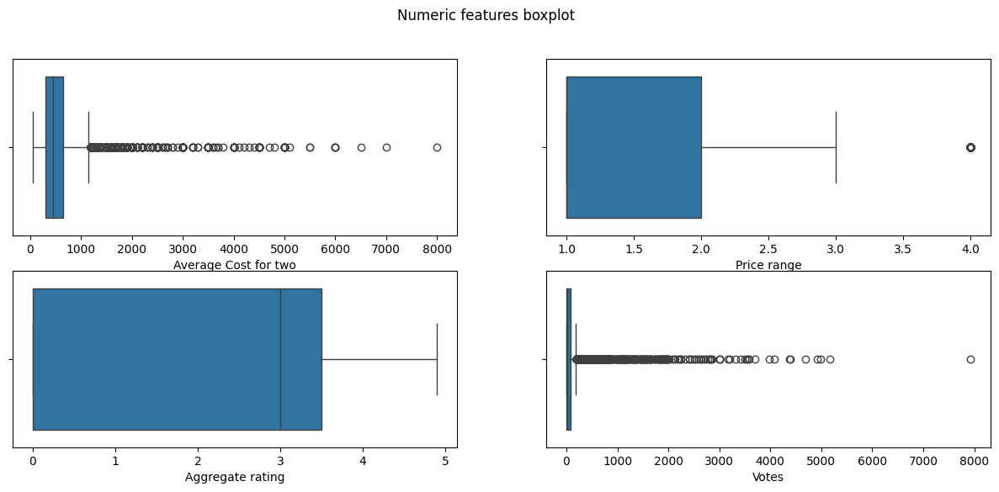

In [15]:
features= df_num.columns
fig, axs = plt.subplots(nrows=2, ncols=2,figsize=(15,6))
fig.suptitle('Numeric features boxplot')
for j, feature in enumerate(features):
    sns.boxplot(ax=axs[j//2, j-2*(j//2)], data=df_num, x=feature)
plt.show()

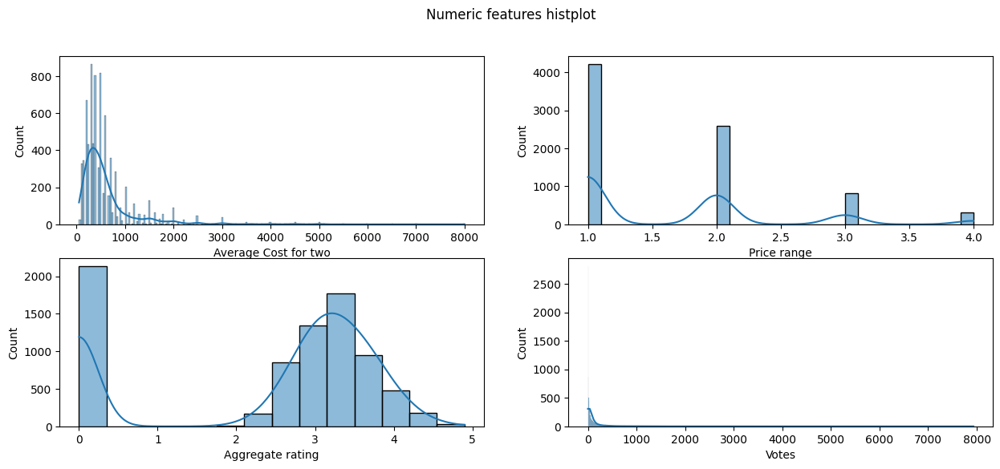

In [16]:
features= df_num.columns
fig, axs = plt.subplots(nrows=2, ncols=2,figsize=(15,6))
fig.suptitle('Numeric features histplot')
for j, feature in enumerate(features):
    sns.histplot(ax=axs[j//2, j-2*(j//2)], data=df_num, x=feature,kde=True)
plt.show()

In [17]:
def identify_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
        
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
        
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    
    return outliers

In [18]:
identify_outliers_iqr(df_num,'Average Cost for two').shape[0]

852

In [19]:
identify_outliers_iqr(df_num,'Votes').shape[0]

956

In [20]:
identify_outliers_iqr(df_num,'Aggregate rating').shape[0]

0

In [21]:
identify_outliers_iqr(df_num,'Price range').shape[0]

304

In [22]:
df_cat= df.select_dtypes(include=['object'])
df_cat.columns

Index(['Restaurant Name', 'City', 'Locality', 'Cuisines', 'Currency',
       'Has Table booking', 'Has Online delivery', 'Rating color',
       'Rating text', 'Country'],
      dtype='object')

Text(0.5, 1.0, 'Top 10 Cuisines Ordered')

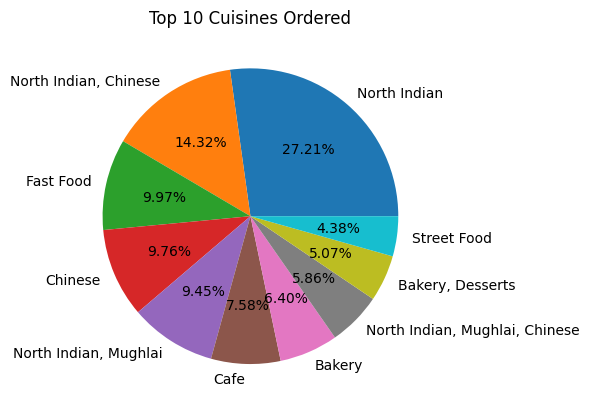

In [23]:
cuisines_values= df_cat['Cuisines'].value_counts().values
cuisines_index= df_cat['Cuisines'].value_counts().index
plt.pie(cuisines_values[:10],labels=cuisines_index[:10],autopct="%1.2f%%",radius=1)
plt.title('Top 10 Cuisines Ordered')

Text(0.5, 1.0, 'Ratings given')

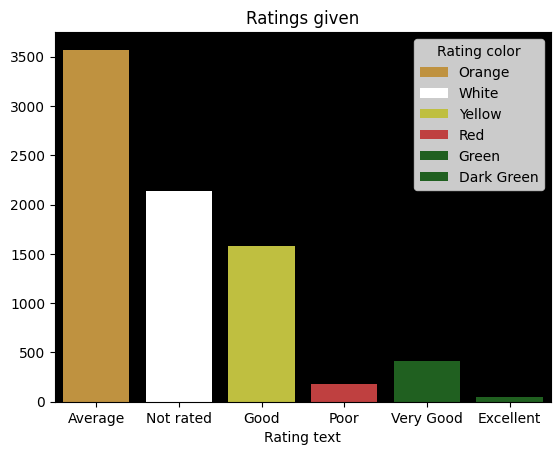

In [24]:
ax = plt.axes()
ax.set_facecolor("black")

sns.countplot(data=df_cat,x='Rating text',hue='Rating color',palette=['orange','white','yellow','red','green','green'],saturation=0.5)
plt.ylabel('')
plt.title('Ratings given')

Text(0.5, 1.0, 'Cities v/s Ratings')

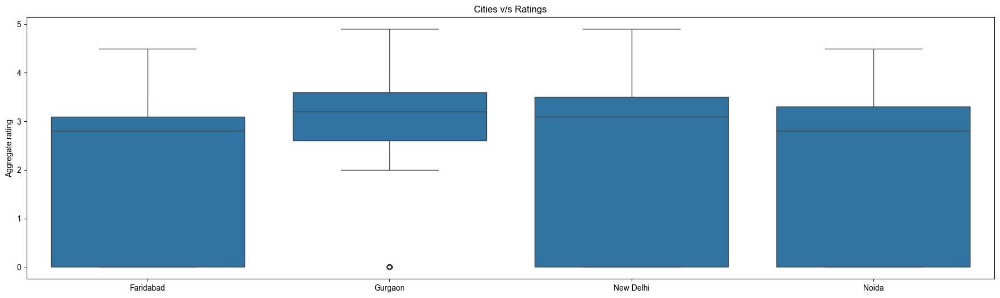

In [25]:
plt.figure(figsize=(22,6))
sns.boxplot(data=df,x='City',y='Aggregate rating')
sns.set_style('white')
plt.xlabel('')
plt.title('Cities v/s Ratings')

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Orient Express - Taj Palace Hotel'),
  Text(1, 0, 'Tian - Asian Cuisine Studio - ITC Maurya'),
  Text(2, 0, 'Bukhara - ITC Maurya'),
  Text(3, 0, 'Wasabi by Morimoto - The Taj Mahal Hotel'),
  Text(4, 0, 'The Spice Route - The Imperial'),
  Text(5, 0, 'Nostalgia at 1911 Brasserie - The Imperial'),
  Text(6, 0, '1911 - The Imperial'),
  Text(7, 0, 'MEGU - The Leela Palace'),
  Text(8, 0, 'House of Ming - The Taj Mahal Hotel'),
  Text(9, 0, '24/7 Restaurant - The Lalit New Delhi')])

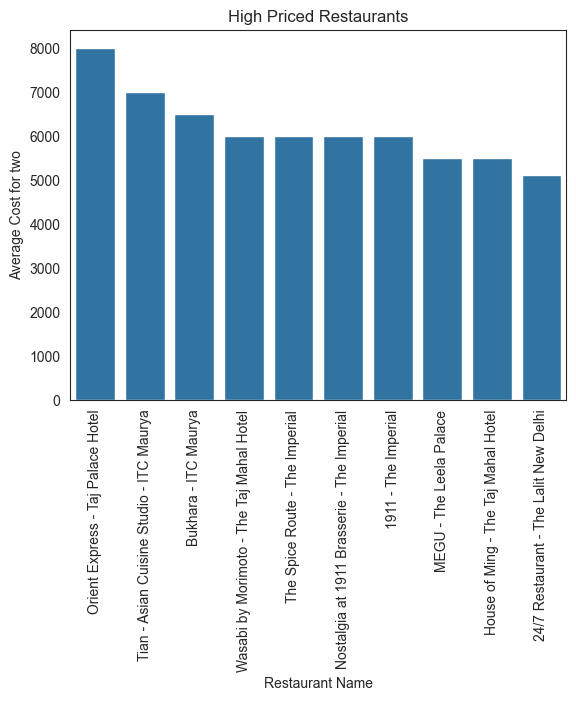

In [26]:
plt.title('High Priced Restaurants')
costlyrest=df.groupby(['Average Cost for two','Restaurant Name']).size().reset_index()
costlyrest=costlyrest.sort_values(by='Average Cost for two',ascending=False)
sns.barplot(data=costlyrest[:10],x='Restaurant Name',y='Average Cost for two')
plt.xticks(rotation=90)

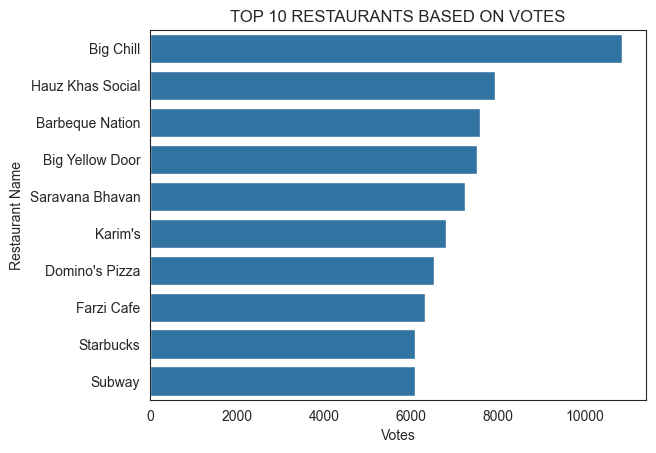

In [27]:
votes=df.groupby("Restaurant Name")["Votes"].sum().reset_index()
votes=votes.sort_values(by="Votes",ascending=False)
sns.barplot(x="Votes",y="Restaurant Name",data=votes[:10])
plt.title("TOP 10 RESTAURANTS BASED ON VOTES")
sns.set_style('white')

In [28]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Locality',
       'Longitude', 'Latitude', 'Cuisines', 'Average Cost for two', 'Currency',
       'Has Table booking', 'Has Online delivery', 'Price range',
       'Aggregate rating', 'Rating color', 'Rating text', 'Votes', 'Country'],
      dtype='object')

<Axes: >

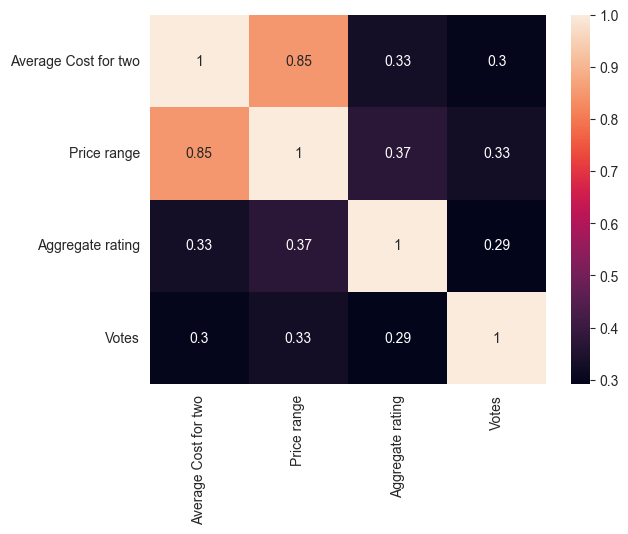

In [29]:
sns.heatmap(data=df_num.corr(),annot=True)

<Axes: xlabel='Average Cost for two', ylabel='Price range'>

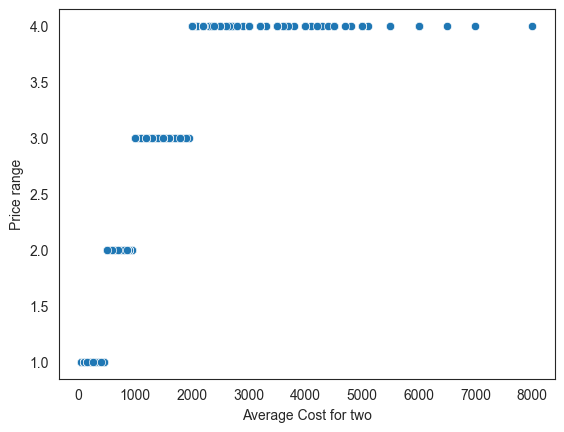

In [30]:
sns.scatterplot(data=df, y='Price range',x='Average Cost for two')

In [31]:
df['Price range']= df['Price range'].replace({1.0:'0-500',2.0:'500-1000',3.0:'1000-2000',4.0:'>2000'})

In [32]:
df['Price range']

865        0-500
866     500-1000
867        0-500
868        0-500
869        0-500
          ...   
9108    500-1000
9109       0-500
9110    500-1000
9111    500-1000
9112       0-500
Name: Price range, Length: 7922, dtype: object

<Axes: xlabel='Average Cost for two', ylabel='Price range'>

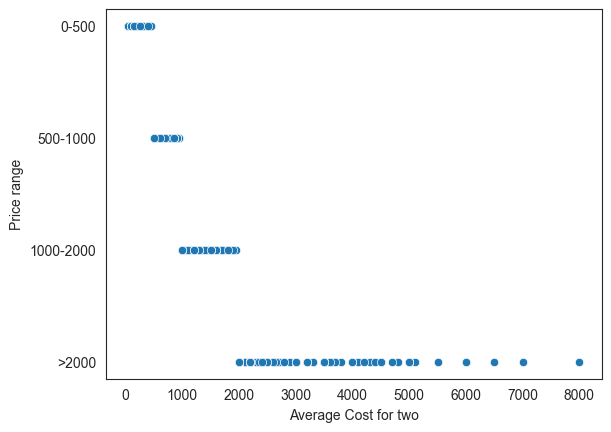

In [33]:
sns.scatterplot(data=df, y='Price range',x='Average Cost for two')

In [34]:
df[['Locality','City']]

,Locality,City
865,Badarpur Border,Faridabad
866,Badarpur Border,Faridabad
867,Badarpur Border,Faridabad
868,Badarpur Border,Faridabad
869,Badarpur Border,Faridabad
...,...,...
9108,"Tulip Mall, Sector 48, Noida",Noida
9109,"Tulip Mall, Sector 48, Noida",Noida
9110,"Tulip Mall, Sector 48, Noida",Noida
9111,"Tulip Mall, Sector 48, Noida",Noida


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
 [Text(0, 0, 'Connaught Place'),
  Text(1, 0, 'Hauz Khas Village'),
  Text(2, 0, 'Khan Market'),
  Text(3, 0, 'Rajouri Garden'),
  Text(4, 0, 'Delhi University-GTB Nagar'),
  Text(5, 0, 'Satyaniketan'),
  Text(6, 0, 'Defence Colony'),
  Text(7, 0, 'Greater Kailash (GK) 2'),
  Text(8, 0, 'Vijay Nagar'),
  Text(9, 0, 'Malviya Nagar'),
  Text(10, 0, 'Greater Kailash (GK) 1'),
  Text(11, 0, 'Janpath'),
  Text(12, 0, 'Select Citywalk Mall, Saket'),
  Text(13, 0, 'Safdarjung'),
  Text(14, 0, 'Pandara Road Market'),
  Text(15, 0, 'Netaji Subhash Place'),
  Text(16, 0, 'Epicuria Food Mall, Nehru Place'),
  Text(17, 0, 'Jama Masjid'),
  Text(18, 0, 'Karol Bagh'),
  Text(19, 0, 'Chandni Chowk')])

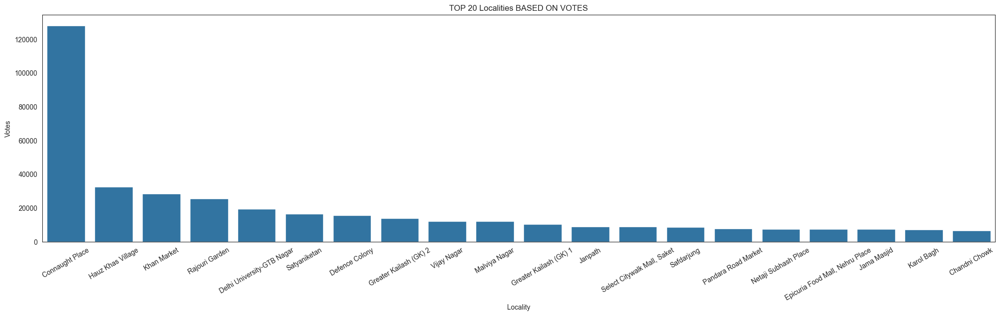

In [35]:
plt.figure(figsize=(25,6))
df_nd= df[df['City']=='New Delhi']
votes_loc=df_nd.groupby("Locality")["Votes"].sum().reset_index()
votes_loc=votes_loc.sort_values(by="Votes",ascending=False)
sns.barplot(y="Votes",x="Locality",data=votes_loc[:20])
plt.title("TOP 20 Localities BASED ON VOTES")
sns.set_style('white')
plt.xticks(rotation=30)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
 [Text(0, 0, 'Cyber Hub, DLF Cyber City'),
  Text(1, 0, 'Sector 29'),
  Text(2, 0, 'MGF Mega City Mall, MG Road'),
  Text(3, 0, 'DLF Phase 3'),
  Text(4, 0, 'MGF Metropolitan Mall, MG Road'),
  Text(5, 0, 'Golf Course Road'),
  Text(6, 0, 'Supermart 1, DLF Phase 4'),
  Text(7, 0, 'DLF Phase 4'),
  Text(8, 0, 'DLF Galleria, DLF Phase 4'),
  Text(9, 0, 'DLF South Point Mall, Golf Course Road'),
  Text(10, 0, 'Ambience Mall, Gurgaon'),
  Text(11, 0, 'DLF Phase 1'),
  Text(12, 0, 'Global Foyer Mall, Golf Course Road'),
  Text(13, 0, 'Sohna Road'),
  Text(14, 0, 'MG Road'),
  Text(15, 0, 'Sector 31'),
  Text(16, 0, 'Cross Point Mall, DLF Phase 4'),
  Text(17, 0, 'Huda City Centre Metro Station, Sector 29, Gurgaon'),
  Text(18, 0, 'Vyapar Kendra, Sushant Lok'),
  Text(19, 0, 'Suncity Business Tower, Golf Course Road')])

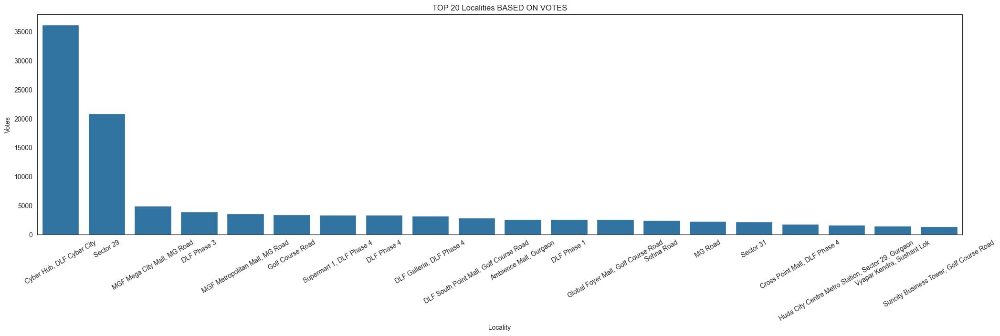

In [36]:
plt.figure(figsize=(25,6))
df_g= df[df['City']=='Gurgaon']
votes_loc=df_g.groupby("Locality")["Votes"].sum().reset_index()
votes_loc=votes_loc.sort_values(by="Votes",ascending=False)
sns.barplot(y="Votes",x="Locality",data=votes_loc[:20])
plt.title("TOP 20 Localities BASED ON VOTES")
sns.set_style('white')
plt.xticks(rotation=30)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
 [Text(0, 0, 'Sector 18'),
  Text(1, 0, 'DLF Mall of India, Sector 18,  Noida'),
  Text(2, 0, 'The Great India Place, Sector 38'),
  Text(3, 0, 'Sector 50'),
  Text(4, 0, 'Sector 37'),
  Text(5, 0, 'Sector 62'),
  Text(6, 0, 'Sector 16'),
  Text(7, 0, 'Spice World Mall, Sector 25'),
  Text(8, 0, 'Sector 110'),
  Text(9, 0, 'Jaipuria Plaza, Sector 26, Noida'),
  Text(10, 0, 'Gardens Galleria, Sector 38 Noida'),
  Text(11, 0, 'Supertech Shopprix Mall, Sector 61'),
  Text(12, 0, 'Sector 12'),
  Text(13, 0, 'Sector 41'),
  Text(14, 0, 'Centre Stage Mall, Sector 18'),
  Text(15, 0, 'Brahmaputra Shopping Complex'),
  Text(16, 0, 'Ganga Shopping Complex, Sector 29'),
  Text(17, 0, 'Sector 15'),
  Text(18, 0, 'Sector 53'),
  Text(19, 0, 'Sector 44')])

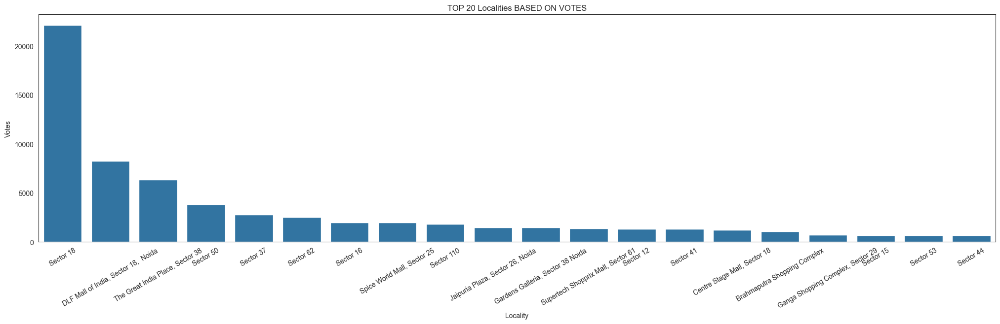

In [37]:
plt.figure(figsize=(25,6))
df_no= df[df['City']=='Noida']
votes_loc=df_no.groupby("Locality")["Votes"].sum().reset_index()
votes_loc=votes_loc.sort_values(by="Votes",ascending=False)
sns.barplot(y="Votes",x="Locality",data=votes_loc[:20])
plt.title("TOP 20 Localities BASED ON VOTES")
sns.set_style('white')
plt.xticks(rotation=30)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
 [Text(0, 0, 'Connaught Place'),
  Text(1, 0, 'Hauz Khas Village'),
  Text(2, 0, 'Khan Market'),
  Text(3, 0, 'Rajouri Garden'),
  Text(4, 0, 'Delhi University-GTB Nagar'),
  Text(5, 0, 'Satyaniketan'),
  Text(6, 0, 'Defence Colony'),
  Text(7, 0, 'Greater Kailash (GK) 2'),
  Text(8, 0, 'Vijay Nagar'),
  Text(9, 0, 'Malviya Nagar'),
  Text(10, 0, 'Greater Kailash (GK) 1'),
  Text(11, 0, 'Janpath'),
  Text(12, 0, 'Select Citywalk Mall, Saket'),
  Text(13, 0, 'Safdarjung'),
  Text(14, 0, 'Pandara Road Market'),
  Text(15, 0, 'Netaji Subhash Place'),
  Text(16, 0, 'Epicuria Food Mall, Nehru Place'),
  Text(17, 0, 'Jama Masjid'),
  Text(18, 0, 'Karol Bagh'),
  Text(19, 0, 'Chandni Chowk')])

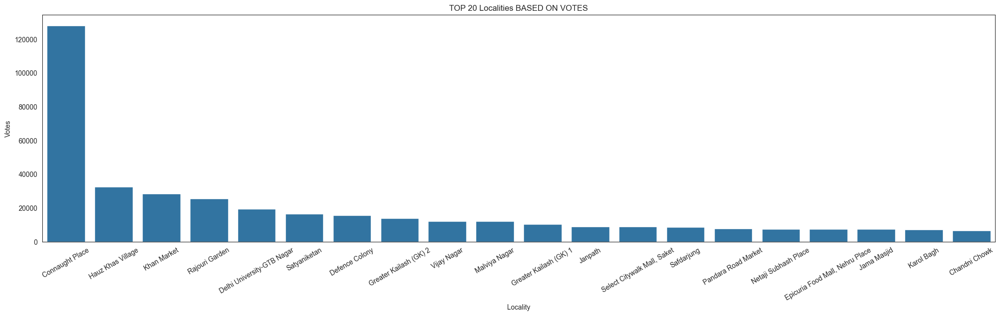

In [38]:
plt.figure(figsize=(25,6))
df_fa= df[df['City']=='Faridabad']
votes_loc=df_nd.groupby("Locality")["Votes"].sum().reset_index()
votes_loc=votes_loc.sort_values(by="Votes",ascending=False)
sns.barplot(y="Votes",x="Locality",data=votes_loc[:20])
plt.title("TOP 20 Localities BASED ON VOTES")
sns.set_style('white')
plt.xticks(rotation=30)

In [39]:
import folium
from folium.plugins import MarkerCluster

map = folium.Map(location=[28.4595, 77.0266], zoom_start=11)

marker_cluster = MarkerCluster().add_to(map)

for index, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],
        icon=folium.Icon(color='blue')
    ).add_to(marker_cluster)

map.save('geographical_distribution.html')
map

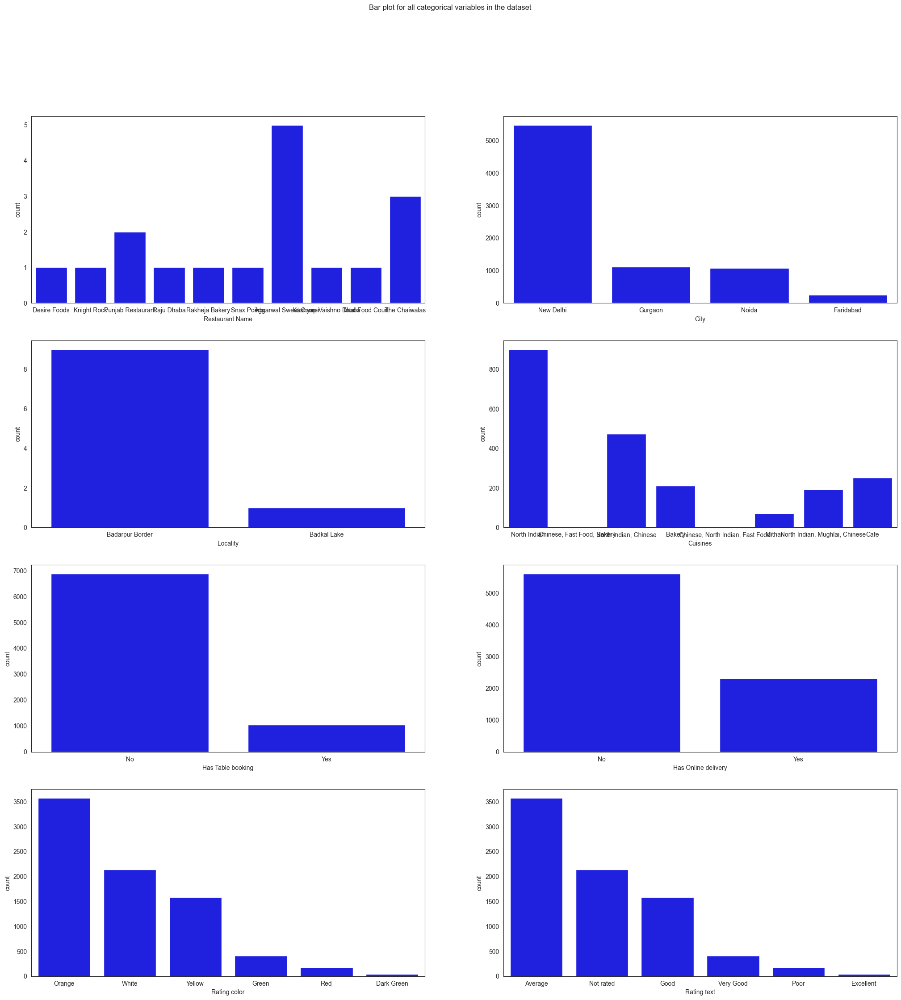

In [40]:
fig, axes = plt.subplots(4, 2, figsize = (25, 25))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'Restaurant Name', data = df_cat, color = 'blue', 
              order = df_cat['Restaurant Name'].head(10).value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'City', data = df_cat, color = 'blue', 
              order =df_cat['City'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'Locality', data = df_cat, color = 'blue', 
              order = df_cat['Locality'].head(10).value_counts().index);
sns.countplot(ax = axes[1, 1], x = 'Cuisines', data = df_cat, color = 'blue', 
              order = df_cat['Cuisines'].head(10).value_counts().index);
sns.countplot(ax = axes[2, 0], x = 'Has Table booking', data = df_cat, color = 'blue', 
              order = df_cat['Has Table booking'].value_counts().index);
sns.countplot(ax = axes[2, 1], x = 'Has Online delivery', data = df_cat, color = 'blue', 
              order = df_cat['Has Online delivery'].value_counts().index);
sns.countplot(ax = axes[3, 0], x = 'Rating color', data = df_cat, color = 'blue', 
              order = df_cat['Rating color'].value_counts().index);
sns.countplot(ax = axes[3, 1], x = 'Rating text', data = df_cat, color = 'blue', 
              order = df_cat['Rating text'].value_counts().index);

In [41]:
df_cat.columns

Index(['Restaurant Name', 'City', 'Locality', 'Cuisines', 'Currency',
       'Has Table booking', 'Has Online delivery', 'Rating color',
       'Rating text', 'Country'],
      dtype='object')

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24],
 [Text(0, 0, ' ILD Trade Centre Mall, Sohna Road'),
  Text(1, 0, 'ARSS Mall, Paschim Vihar'),
  Text(2, 0, 'Aaya Nagar'),
  Text(3, 0, 'Adchini'),
  Text(4, 0, 'Aditya Mega Mall, Karkardooma'),
  Text(5, 0, 'Aerocity'),
  Text(6, 0, 'Aggarwal City Mall, Pitampura'),
  Text(7, 0, 'Aggarwal City Plaza, Rohini'),
  Text(8, 0, 'Alaknanda'),
  Text(9, 0, 'Ambience Mall, Gurgaon'),
  Text(10, 0, 'Ambience Mall, Vasant Kunj'),
  Text(11, 0, 'Anand Lok'),
  Text(12, 0, 'Anand Vihar'),
  Text(13, 0, 'Andaz Delhi, Aerocity'),
  Text(14, 0, 'Ansal Plaza Mall, Greater Noida'),
  Text(15, 0, 'Ansal Plaza Mall, Khel Gaon Marg'),
  Text(16, 0, 'Ansal Plaza Mall, Palam Vihar'),
  Text(17, 0, 'Ardee City'),
  Text(18, 0, 'Asaf Ali Road'),
  Text(19, 0, 'Ashok Vihar Phase 1'),
  Text(20, 0, 'Ashok Vihar Phase 2'),
  Text(21, 0, 'Ashok Vihar Phase 3'),
  Text(22, 0,

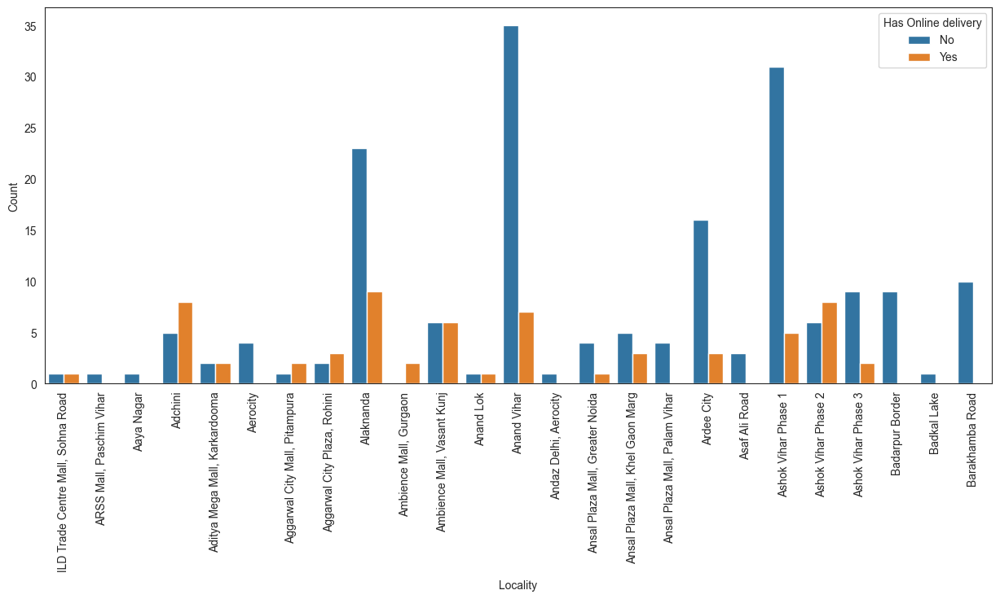

In [42]:
plt.figure(figsize=(15,6))
ol_df= df_cat.groupby(['Locality','Has Online delivery']).size().reset_index().rename(columns={0:'Count'})
sns.barplot(data=ol_df[:40], x='Locality',y='Count',hue='Has Online delivery')
plt.xticks(rotation=90)

In [45]:
df.to_csv('updated_zomato.csv')